In [1]:
%reload_ext autoreload
%autoreload 2
# Import packages and set working directory if needed here
import datetime
import glob
import os

import tempfile

import earthpy.spatial as es
import geopandas as gpds
from matplotlib import pyplot as plt
import numpy as np
import numpy.ma as ma
import pandas as pd
from pyproj import Proj, transform
from rasterio import mask
from rasterio.transform import from_origin
import rasterio as rio
import rasterio.plot
import rasterstats as rs
import tarfile

import common_functions as common

landsat_file_root = os.path.join(common.original_raster_data, 'landsat_summer')
landsat_raw_data = os.path.join(common.original_raster_data, 'landsat_raw')
data_year_list = ['2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018']

avalanche_overlap_shape = None

band_colors_landsat_versions = {
                                   '7':{  
                                      'blue':'band1',
                                      'green':'band2',
                                      'red':'band3',
                                      'nir':'band4'
                                   },
                                   '8':{  
                                      'blue':'band2',
                                      'green':'band3',
                                      'red':'band4',
                                      'nir':'band5'
                                   }
                                }

def open_and_crop_geotiff(geotiff_path, out_path, crop_by):
    """
    Open geotiff and crop to the extent of the crop_by geodataframe
    
    Parameters
    ----------
    geotiff_path: string
        Path of the input geotiff to be cropped
    out_path: string
        Target path to write the output to
    crop_by: pandas geodataframe
        Geodataframe or shape to crop by 
    """
    with rio.open(geotiff_path) as src:
        # Reproject our shape to whatever projection the landsat data is in
        src_meta = src.meta.copy()
        crop_by_reprojected = crop_by.to_crs(src.crs)
        band_masked, transform_cropped = mask.mask(src, crop_by_reprojected.geometry, crop=True)
        src_meta['transform'] = transform_cropped
        src_meta['width'] = band_masked.shape[2]
        src_meta['height'] = band_masked.shape[1]
    with rasterio.open(out_path, 'w', **src_meta) as dst:
        dst.write(band_masked)   
    

def create_archive_from_tgz(zipped_data_dir, target_data_dir):
    """
    Unzip the tgz files that are in the zipped_data_folder and move them to the
    target_dir only if they don't already exist in the target_dir.
    
    Parameters
    ----------
    zipped_data_dir: string
        Source directory
    target_dir: string
        Target directory
    """
    file_list = glob.glob(os.path.join(zipped_data_dir, "*.tar.gz"))
    print("Number of files found: %d" % len(file_list))
    files_in_data_dir = [os.path.basename(base_name) for base_name in glob.glob(os.path.join(target_data_dir, "*"))]
    print("Number of files already present: %d" % len(files_in_data_dir))
    files_to_upload = [file_to_unzip 
                       for file_to_unzip 
                       in file_list 
                       if os.path.basename(file_to_unzip.replace(".tar.gz", ""))
                       not in files_in_data_dir]    
    print("Number of files to upload: %d" % len(files_to_upload))
    for file_name in files_to_upload:
        with tempfile.TemporaryDirectory() as temporary_directory:
            scene_name = unzip_file(file_name, target_data_dir=temporary_directory)    
            band_list = glob.glob(os.path.join(temporary_directory, scene_name, "*.tif"))
            landsat_version = landsat_path_to_version(scene_name)
            bands_to_save = [i for i in band_colors_landsat_versions[landsat_version].values()] + ["qa"]
            band_list = [fname for fname in band_list for bands_to_save_match in bands_to_save if bands_to_save_match in fname]
            scene_directory = os.path.join(target_data_dir, scene_name)
            os.mkdir(scene_directory)
            for band in band_list:
                band_basename = os.path.basename(band)
                open_and_crop_geotiff(band, os.path.join(scene_directory, band_basename), common.study_area_box_gdf)
        
def unzip_file(file_name, target_data_dir="./"):    
    """
    Unzip all tgz files in file_list and save to target_data_dir.  Each file will
    be saved into its own directory, named the same as the .tgz name, without
    the extension.
    
    Parameters
    ----------
    file_name: string
        Path of the file to unzip
    target_data_dir: str
        Directory to put the files into
    """
    tar = tarfile.open(file_name, "r:gz")
    file_base_no_ext = os.path.basename(file_name.replace(".tar.gz", ""))
    directory_name = os.path.join(target_data_dir, file_base_no_ext)
    tar.extractall(path=directory_name)
    tar.close()
    return file_base_no_ext


def mask_clouds(qa_arr, landsat_ver="8"):
    """
    Creates a cloud mask given a qa_raster.
    
    Parameters
    ----------
    qa_arr: ndarray
        A qa raster containing information about cloud cover.
    landsat_ver: str
        A string representation of the landsat version.
        
    Returns
    ----------
    cloud_mask: ndarray
        A boolean array the same shape as qa_raster containing 
        True values where clouds are present and False values 
        where there are no clouds.
    """    
    if landsat_ver == "8":
        # Much of the terrain was being marked as cloud with the cloud_shadow and cloud 
        # mask values, so had to only mask high confidence clouds.
        cloud_shadow = []#[328, 392, 840, 904, 1350]
        cloud = [352, 368, 416, 432, 480, 864, 880, 928, 944, 992]
        high_confidence_cloud = [480, 992]
        high_confidence_cirrus = [834, 836, 840, 848, 864, 880, 898, 900, 904, 912, 928, 944, 992]
        snow_ice = [336, 368, 400, 432, 848, 880, 912, 944, 1352]
        water = [324, 388, 836, 900, 1348]
        combined_list = list(set(cloud_shadow + 
                                 cloud + 
                                 high_confidence_cloud + 
                                 high_confidence_cirrus + 
                                 snow_ice + 
                                 water))
    elif landsat_ver == "7":
        # Much of the terrain was being marked as cloud with the cloud_shadow and cloud 
        # mask values, so had to only mask high confidence clouds.
        cloud_shadow = []#[72, 136]
        cloud = [] #[96, 112, 160, 176, 224]
        low_confidence_cloud = [] #[66, 68, 72, 80, 96, 112]
        medium_confidence_cloud = [] #[130, 132, 136, 144, 160, 176]
        high_confidence_cloud = [224]
        snow_ice = [80, 112, 144, 176]
        water = [68, 132]
        combined_list = list(set(cloud_shadow + 
                                 cloud + 
                                 low_confidence_cloud + 
                                 medium_confidence_cloud + 
                                 high_confidence_cloud + 
                                 snow_ice + 
                                 water))
    else:
        print("Landsat version %s not recognized.  No cloud removal performed." % landsat_ver)
        combined_list = []
    # Create a mask with True values indicating non-cloud pixels
    all_masked_values = np.array(combined_list)
    cloud_mask = np.isin(qa_arr, all_masked_values)
    
    return cloud_mask


def files_from_pattern(pattern, expect_single_file=False):
    """
    From a given pattern, retrieve the filenames.  If expect_single_file is True,
    raise an error if multiple files are returned.  If no files are returned, print
    a message.
    
    TODO: expand pattern to regex instead of only wildcards.
    
    Parameters
    ----------
    pattern: str
        A pattern to match filename.  At this time, only wildcards are accepted (no regular
        expressions).
    expect_single_file: bool
        When True, a valueError is raised if more than one file is returned.
    
    Returns
    ----------
    [file names]: list
        A list of returned file names.
    """
    returned_files = glob.glob(pattern)
    if len(returned_files) == 0:
        print("No files found for pattern %s." % pattern)
    if expect_single_file and len(returned_files) > 1:
        raise ValueError("Expecting a single value to be returned "
                         "and found %d values for pattern %s." 
                         % (len(returned_files), pattern))
    return returned_files

def scene_path_to_year(path):
    """
    Determine the year given a scene ID
    
    Parameters
    ----------
    path: string
        Landsat scene ID (see https://landsat.usgs.gov/landsat-collections#Prod%20IDs)
    
    Returns
    ----------
    [year]: string
        Landsat year
    """
    return os.path.basename(path)[10:14]

def landsat_path_to_version(path):
    """
    Determine the landsat version given a scene ID
    
    Parameters
    ----------
    path: string
        Landsat scene ID (see https://landsat.usgs.gov/landsat-collections#Prod%20IDs)
    
    Returns
    ----------
    [year]: string
        Landsat version (single digit string)
    """
    return os.path.basename(path)[3:4]


Number of files found: 133
Number of files already present: 134
Number of files to upload: 0
Analyzing year 2008
Analyzing file LE070370322008061201T1-SC20181210013329
   year                                    fname  \
0  2008  LE070370322008061201T1-SC20181210013329   

                                            NDVI_arr  
0  [[nan, nan, nan, nan, nan, nan, nan, nan, nan,...  
Analyzing file LE070370322008062801T1-SC20181210012455
   year                                    fname  \
0  2008  LE070370322008061201T1-SC20181210013329   
1  2008  LE070370322008062801T1-SC20181210012455   

                                            NDVI_arr  
0  [[nan, nan, nan, nan, nan, nan, nan, nan, nan,...  
1  [[nan, nan, nan, nan, nan, nan, nan, nan, nan,...  


C:\Users\mdorf\Anaconda3\envs\earth-analytics-python\lib\site-packages\ipykernel_launcher.py:116: RuntimeWarning: All-NaN axis encountered
C:\Users\mdorf\Anaconda3\envs\earth-analytics-python\lib\site-packages\ipykernel_launcher.py:118: RuntimeWarning: All-NaN axis encountered


Analyzing file LE070370322008071401T1-SC20181210013126
   year                                    fname  \
0  2008  LE070370322008061201T1-SC20181210013329   
1  2008  LE070370322008062801T1-SC20181210012455   
2  2008  LE070370322008071401T1-SC20181210013126   

                                            NDVI_arr  
0  [[nan, nan, nan, nan, nan, nan, nan, nan, nan,...  
1  [[nan, nan, nan, nan, nan, nan, nan, nan, nan,...  
2  [[nan, nan, nan, nan, nan, nan, nan, nan, nan,...  
Analyzing file LE070370322008073001T1-SC20181210012818
   year                                    fname  \
0  2008  LE070370322008061201T1-SC20181210013329   
1  2008  LE070370322008062801T1-SC20181210012455   
2  2008  LE070370322008071401T1-SC20181210013126   
3  2008  LE070370322008073001T1-SC20181210012818   

                                            NDVI_arr  
0  [[nan, nan, nan, nan, nan, nan, nan, nan, nan,...  
1  [[nan, nan, nan, nan, nan, nan, nan, nan, nan,...  
2  [[nan, nan, nan, nan, nan, nan, 

10  [[nan, nan, nan, nan, nan, nan, nan, nan, nan,...  
Analyzing file LE070380322008082201T1-SC20181210012024
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   

                                             NDVI_arr  
0   [[nan, nan, nan, nan, nan, nan, nan, nan, nan,...  
1   [[nan, nan, nan, nan, nan, nan, nan, nan, nan,...  
2   [[nan, nan, nan, nan, nan, 

C:\Users\mdorf\Anaconda3\envs\earth-analytics-python\lib\site-packages\ipykernel_launcher.py:148: RuntimeWarning: All-NaN slice encountered
C:\Users\mdorf\Anaconda3\envs\earth-analytics-python\lib\site-packages\rasterstats\io.py:294: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")
C:\Users\mdorf\Anaconda3\envs\earth-analytics-python\lib\site-packages\numpy\core\_methods.py:29: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims)
C:\Users\mdorf\Documents\earth-data-analytics\earth-analytics\avalanche-path-mapping\common_functions.py:152: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  shape[statistic] = [i[statistic] for i in results_

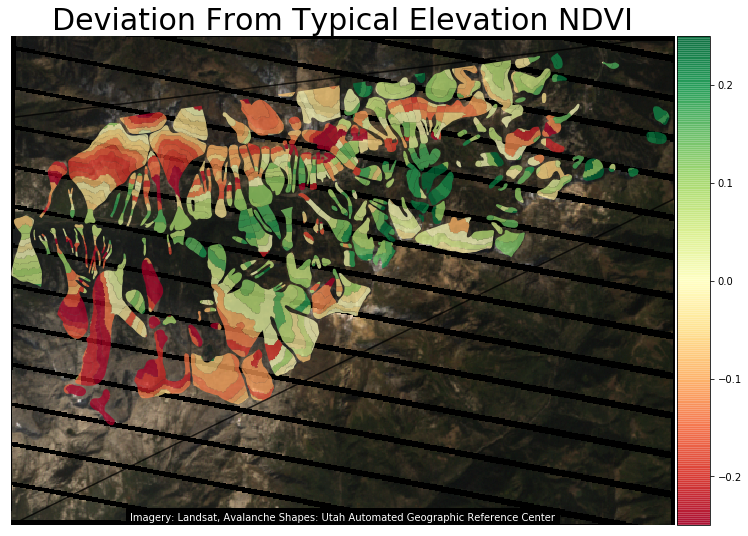

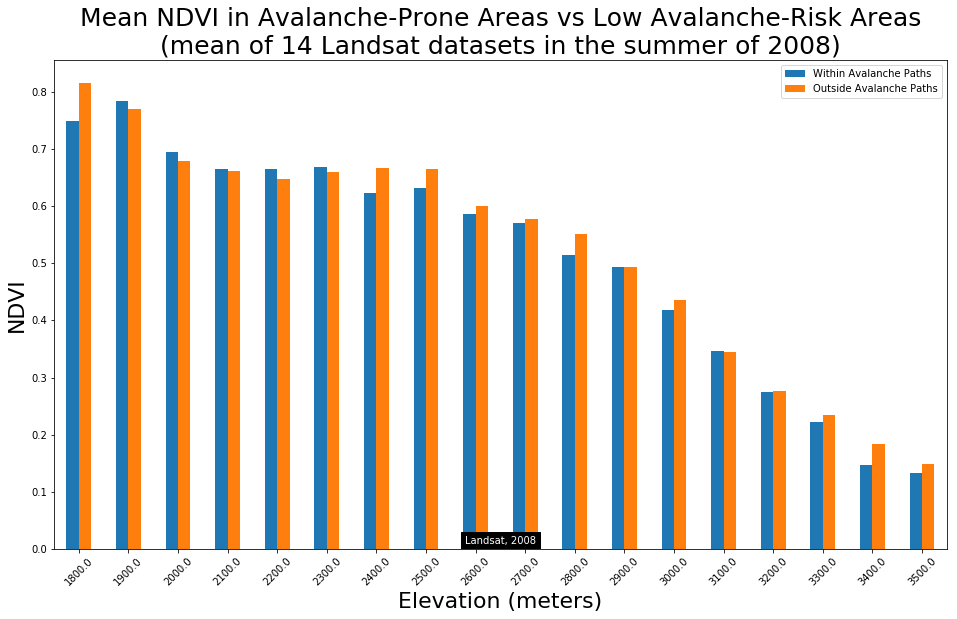

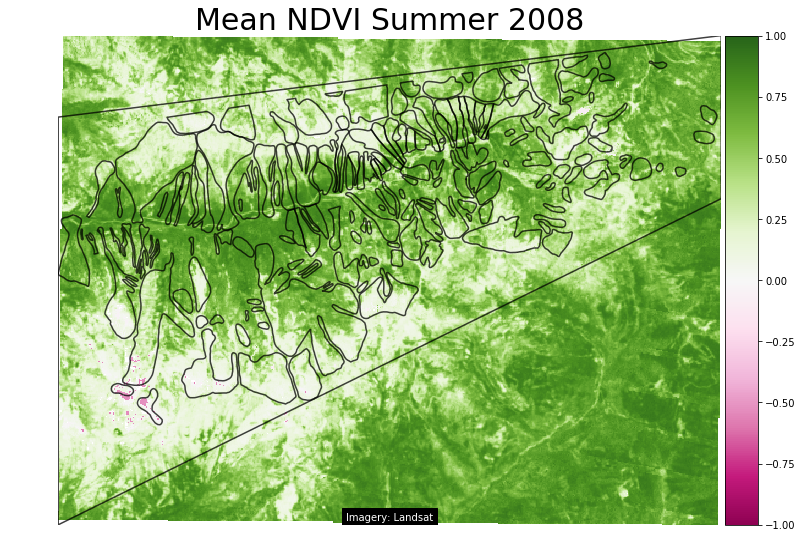

Analyzing year 2009
Analyzing file LE070380322009060601T2-SC20181210013115
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   

                                             NDVI_arr  
0   [[nan, nan, nan,

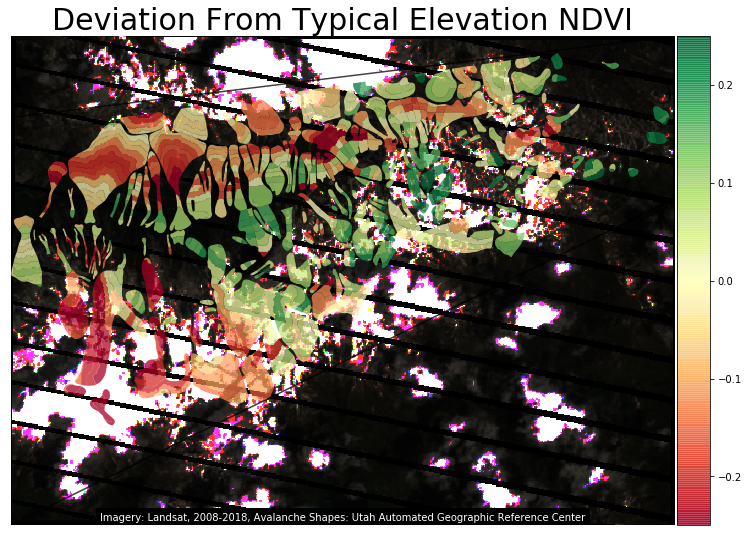

Analyzing file LE070380322009062201T1-SC20181210012951
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   

                                           

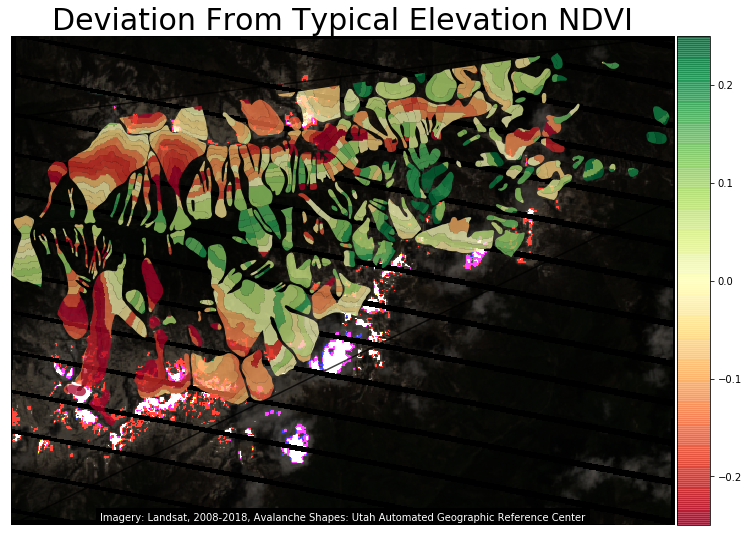

Analyzing file LE070380322009070801T1-SC20181210013021
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   
16  2009  LE070380322009070801T1-SC201812100

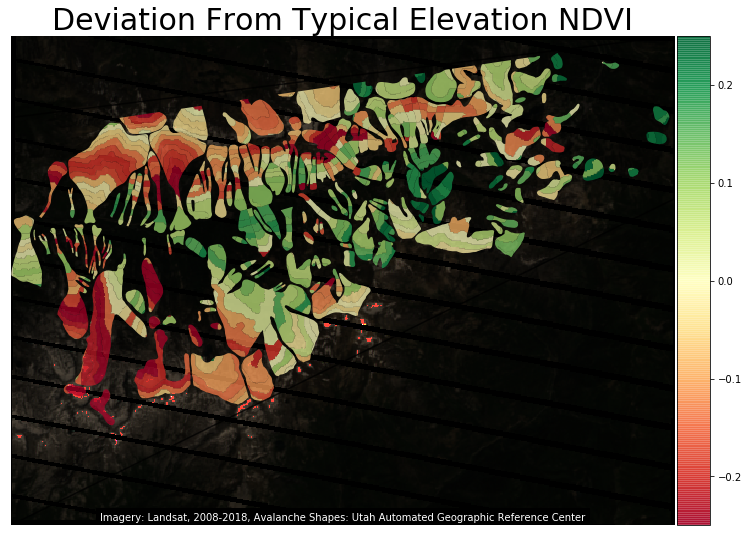

Analyzing file LE070380322009072401T1-SC20181210012255
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   
16  2009  LE070380322009070801T1-SC201812100

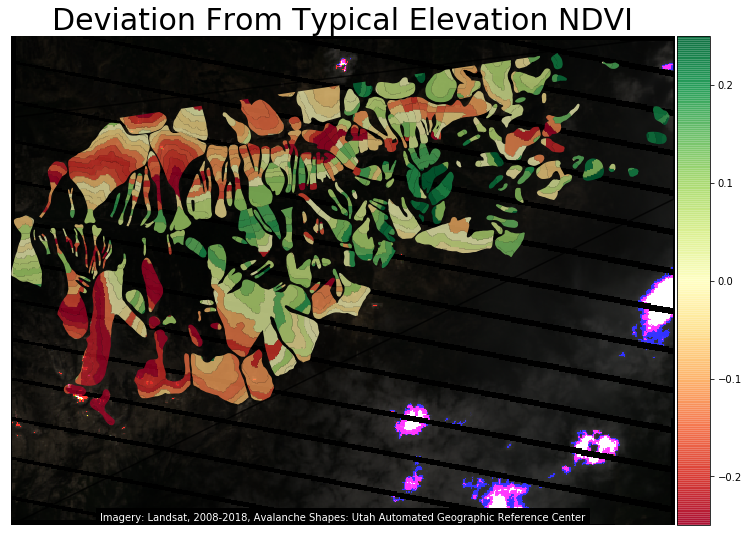

Analyzing file LE070380322009080901T1-SC20181210012016
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   
16  2009  LE070380322009070801T1-SC201812100

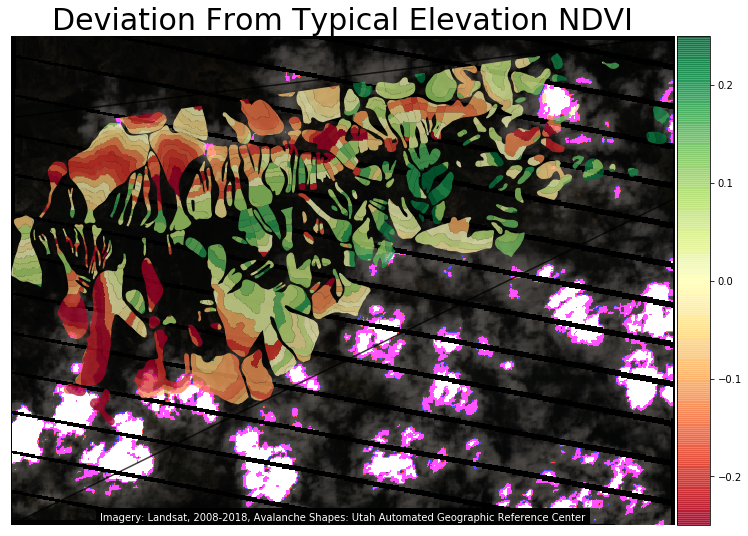

Analyzing file LE070380322009082501T1-SC20181210011856
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   
16  2009  LE070380322009070801T1-SC201812100

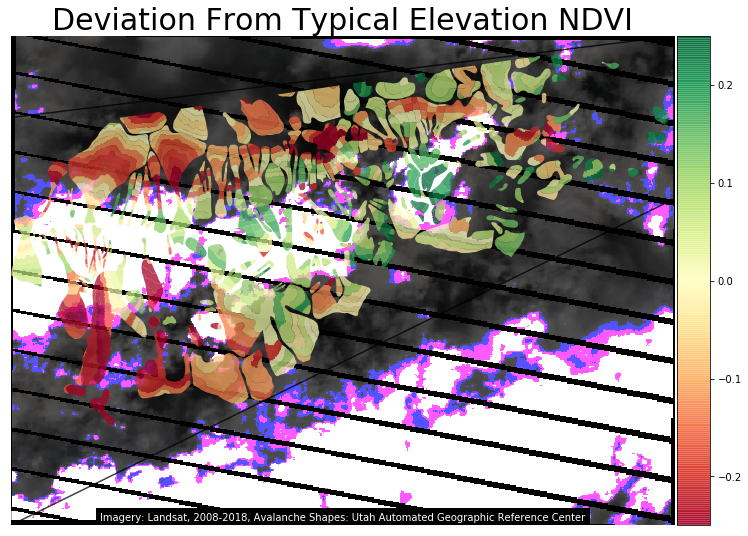

Analyzing file LE070380322009091001T1-SC20181210012715
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   
16  2009  LE070380322009070801T1-SC201812100

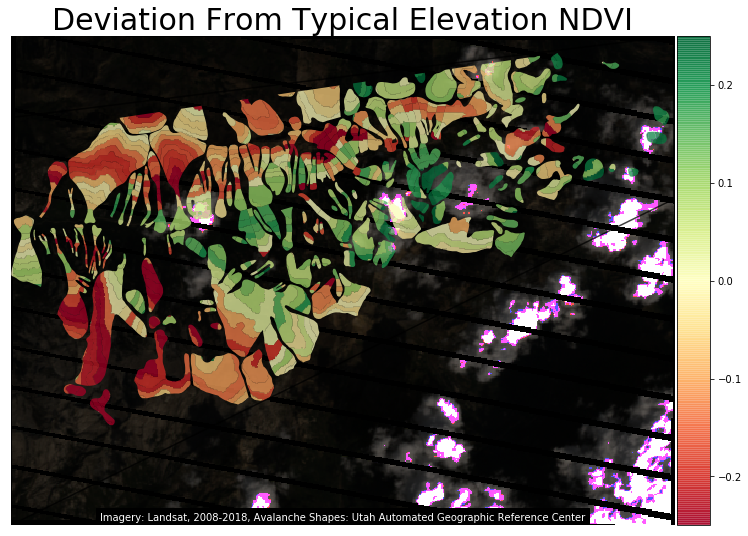

Analyzing file LE070380322009092601T1-SC20181210011955
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   
16  2009  LE070380322009070801T1-SC201812100

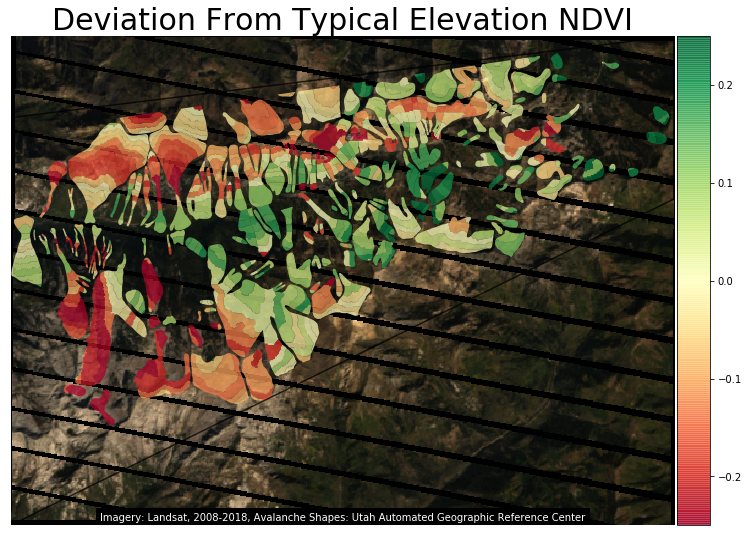

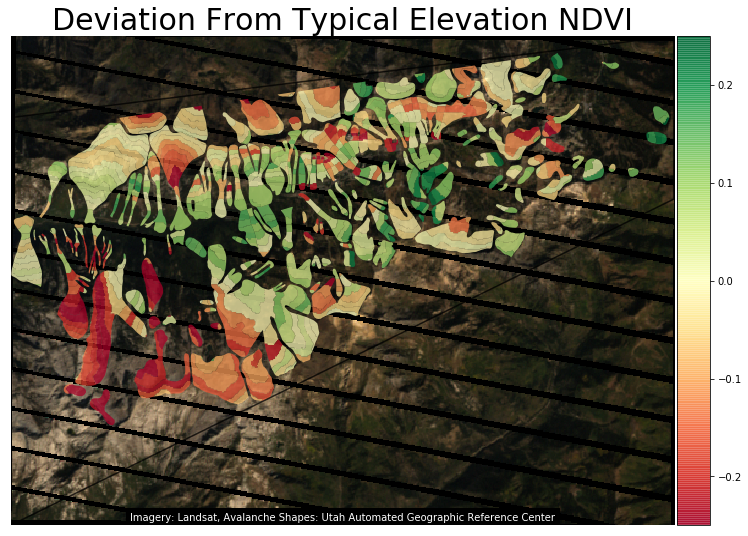

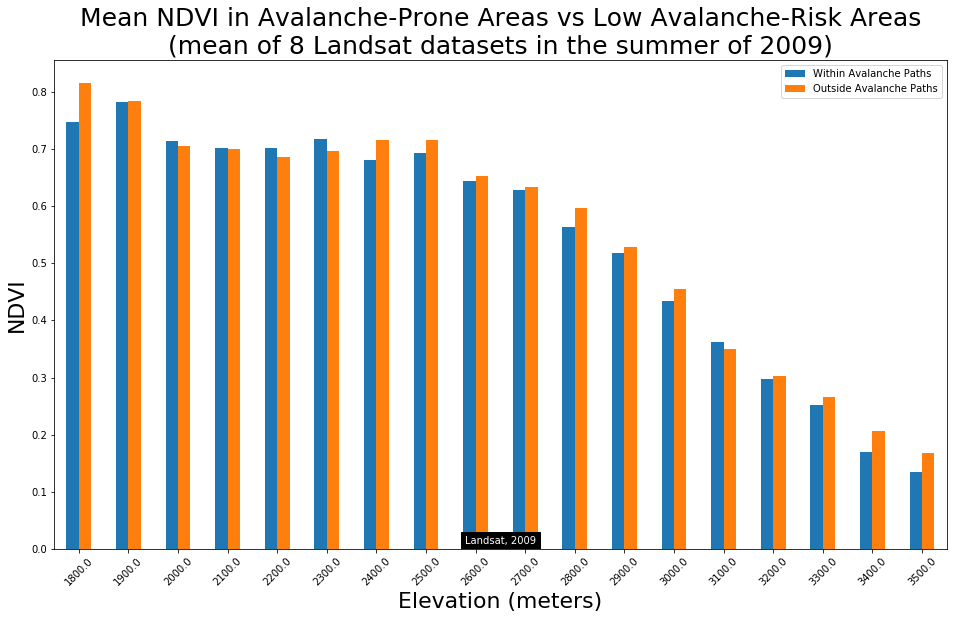

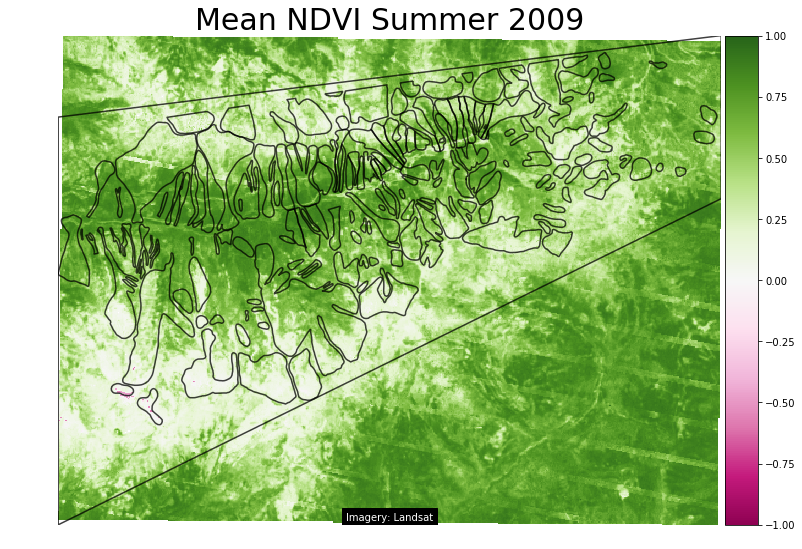

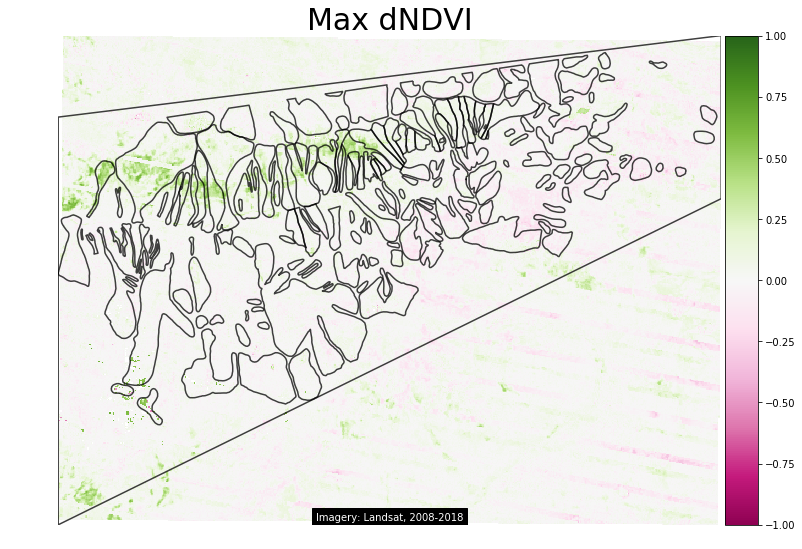

Analyzing year 2010
Analyzing file LE070380322010060901T1-SC20181210012015
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   
16  2009  LE070380322009

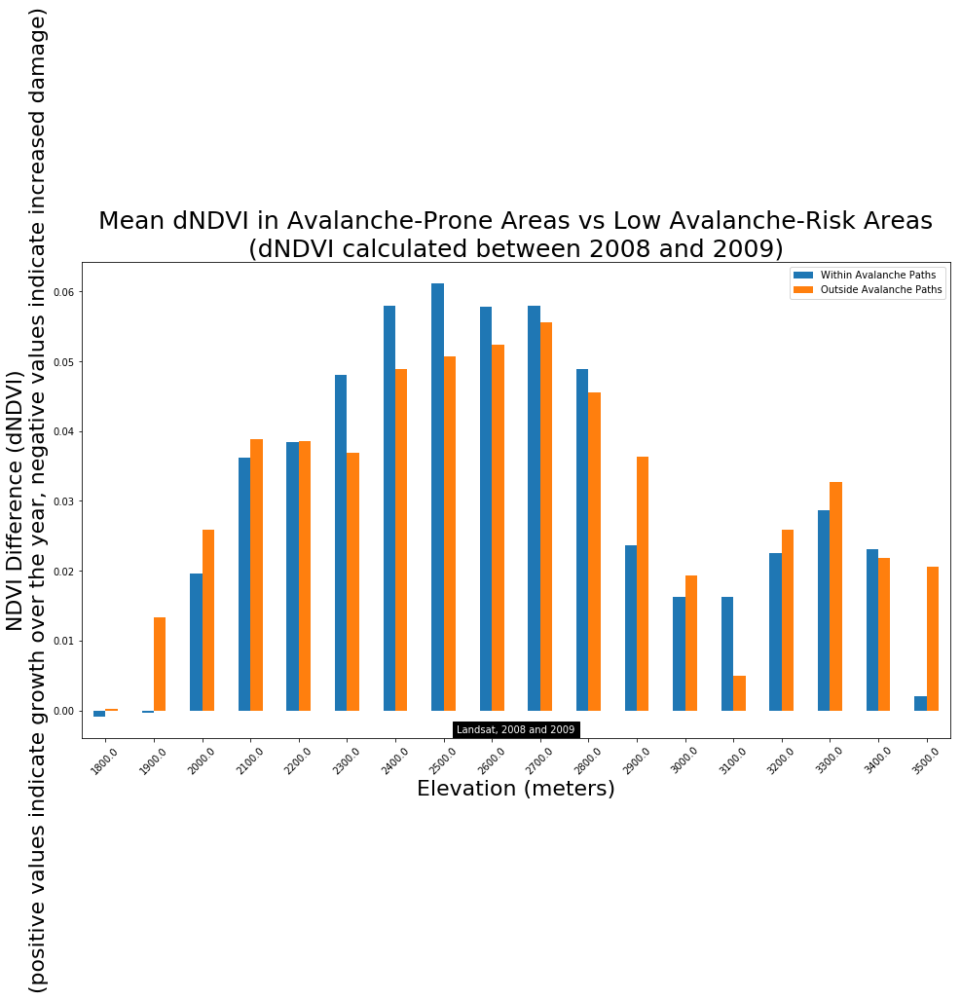

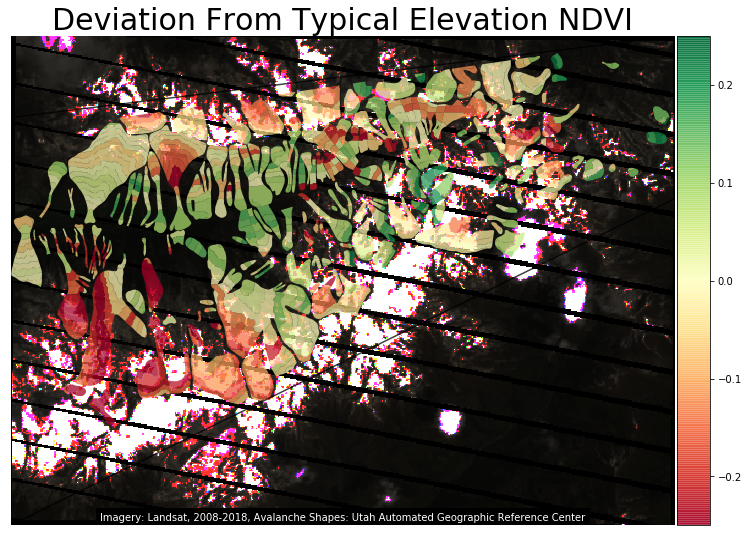

Analyzing file LE070380322010062501T1-SC20181210012245
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   
16  2009  LE070380322009070801T1-SC201812100

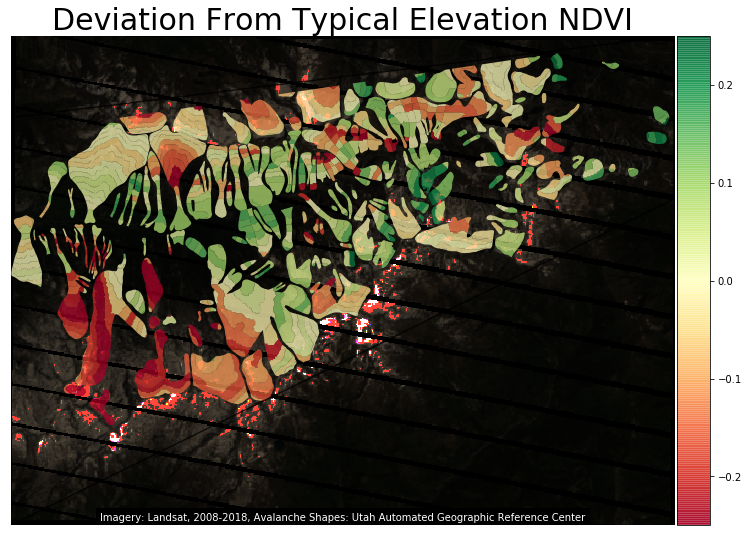

Analyzing file LE070380322010071101T1-SC20181210012831
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   
16  2009  LE070380322009070801T1-SC201812100

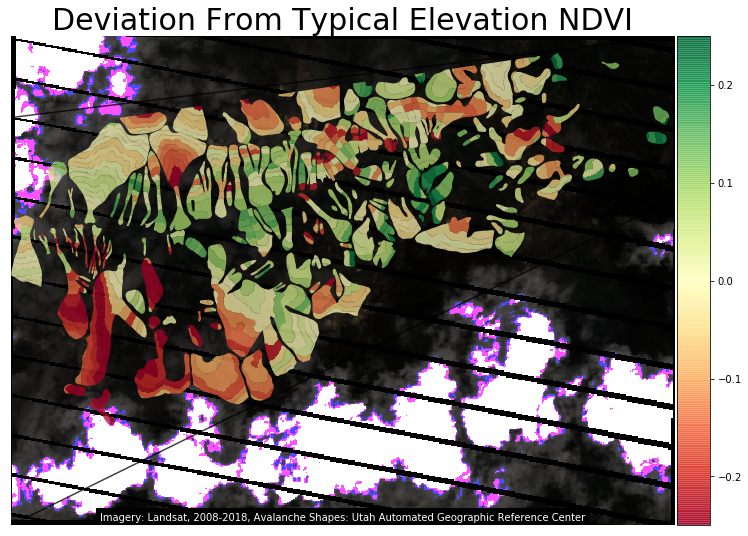

Analyzing file LE070380322010072701T1-SC20181210012830
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   
16  2009  LE070380322009070801T1-SC201812100

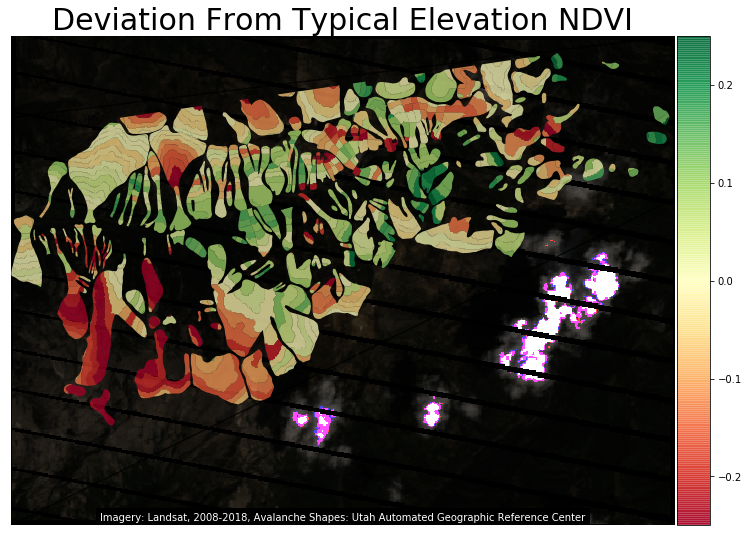

Analyzing file LE070380322010081201T1-SC20181210013906
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   
16  2009  LE070380322009070801T1-SC201812100

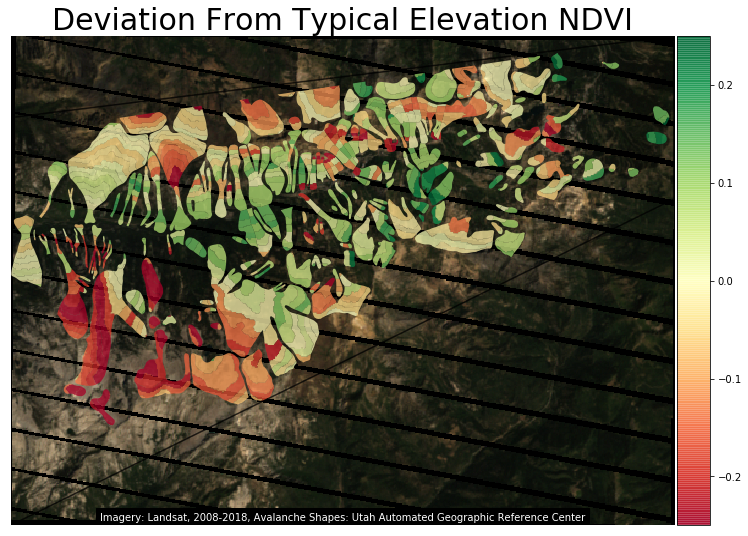

Analyzing file LE070380322010082801T1-SC20181210012622
    year                                    fname  \
0   2008  LE070370322008061201T1-SC20181210013329   
1   2008  LE070370322008062801T1-SC20181210012455   
2   2008  LE070370322008071401T1-SC20181210013126   
3   2008  LE070370322008073001T1-SC20181210012818   
4   2008  LE070370322008083101T1-SC20181210011826   
5   2008  LE070370322008091601T1-SC20181210012422   
6   2008  LE070380322008060301T1-SC20181210012946   
7   2008  LE070380322008061901T1-SC20181210013107   
8   2008  LE070380322008070501T1-SC20181210015344   
9   2008  LE070380322008072101T1-SC20181210015348   
10  2008  LE070380322008080601T1-SC20181210012506   
11  2008  LE070380322008082201T1-SC20181210012024   
12  2008  LE070380322008090701T1-SC20181210020234   
13  2008  LE070380322008092301T1-SC20181210013522   
14  2009  LE070380322009060601T2-SC20181210013115   
15  2009  LE070380322009062201T1-SC20181210012951   
16  2009  LE070380322009070801T1-SC201812100

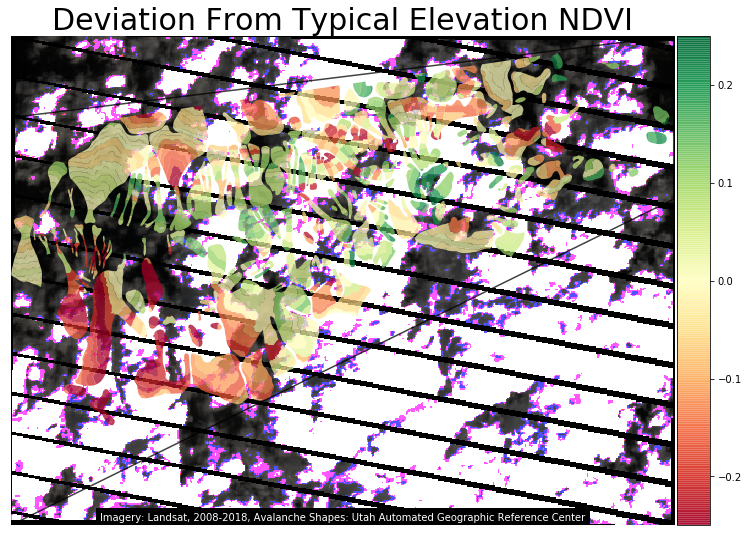

Analyzing file LE070380322010091301T1-SC20181210012856


In [ ]:
# This should match the qa layer
qa_match = 'pixel_qa'

# Set an elevation threshold, in meters, to limit our elevation for our dNDVI analysis
minimum_elevation_threshold = 0
maximum_elevation_threshold = 3000

running_max_dndvi = None

# The order which we will be concatenating our tifs
color_order = ['red', 'green', 'blue', 'nir']

ndvi_by_year = {}

# Create a dataframe to hold NDVI values for each scene
ndvi_df = pd.DataFrame(columns=["year", "fname", "NDVI_arr"])

mean_below_thresh = pd.DataFrame(columns=["year", "mean_ndvi_in_slide", "mean_ndvi_out_of_slide", "mean_dndvi_in_slide", "mean_dndvi_out_of_slide", "snow_depth"])

create_archive_from_tgz(landsat_raw_data, landsat_file_root)
    
file_list = glob.glob(os.path.join(landsat_file_root, "L*"))
total_array_count = 0
running_ndvi_sum_array = None
only_analyze_version_number = None
avalanches_only = None

# Loop through each year in the outer loop
for year in data_year_list:                
    print("Analyzing year %s" % year)
    year_list_subset = [file for file in file_list if scene_path_to_year(file) == year]
    if not year_list_subset:
        print("No files found for year %s" % (year))
        continue
    accumulated_ndvi_arrays = []
    
    # Loop through each file for the specified year in the inner loop
    for file in year_list_subset:
        file_basename = os.path.basename(file)
        print("Analyzing file %s" % file_basename)
        landsat_version_number = landsat_path_to_version(file_basename)
        
        # If this landsat version number is not to be analyzed, continue to the next iteration
        if only_analyze_version_number is not None and only_analyze_version_number == landsat_version_number:
            continue
        band_colors = band_colors_landsat_versions[landsat_version_number]        
        accumulated_bands_list = []
        accumulated_bands_list_unmasked = []       

        # Get QA layer to create our cloud mask
        qa_file_name = files_from_pattern(os.path.join(file, "*%s*" % qa_match), 
                                             expect_single_file=True)[0]

        with rio.open(qa_file_name) as src:
            # Reproject our shape to whatever projection the landsat data is in
            landsat_crs = src.crs
            landsat_affine = src.transform
            qa_arr = src.read()
            qa_arr = np.squeeze(qa_arr)
            cloud_mask = mask_clouds(qa_arr, landsat_ver=landsat_version_number)

        if avalanche_overlap_shape is None:
            # This step takes forever when you run it for the first 
            # time and if the geojson isn't available on disk
            # Would prefer to do this once at the top, but we need
            # to know the crs of the landsat file we're loading
            # Generate a single file that contains the union of the avalanche shapes
            avalanche_overlap_shape = common.generate_unioned_avalanche_overlay(landsat_crs)
            
            # Generate a single file that contains the shapes in the above shape, only if they fall within 
            # a specified elevation range.
            shapefile_below_threshold = avalanche_overlap_shape[(avalanche_overlap_shape['height_bucket'] < maximum_elevation_threshold) & (avalanche_overlap_shape['height_bucket'] > minimum_elevation_threshold)]
            
        # Loop through the colors necessary to create NDVI
        for color in color_order:
            band_file_name = files_from_pattern(os.path.join(file, "*%s*" % band_colors[color]), 
                                                expect_single_file=True)[0]
            with rio.open(band_file_name) as src:
                # Reproject our shape to whatever projection the landsat data is in
                band = src.read()
                band = np.squeeze(band)
                
                # Mask invalid values
                band[band == src.nodatavals] = ma.masked
                
                # Remove the banding effect due to sattelite malfunction with landsat 7 after 2003
                if landsat_version_number == 7 and int(year) > 2003:
                    band[band == 0] = ma.masked     
                
                # Save image without cloud mask to visually inspect how well our cloud mask is working
                accumulated_bands_list_unmasked.append(band.copy())

                # Mask clouds                    
                band[cloud_mask] = ma.masked     
                
                accumulated_bands_list.append(band)          

        # Create arrays from our cloud-masked and no-cloud-masked band lists
        accumulated_bands_arr = np.array(accumulated_bands_list)
        accumulated_bands_arr_unmasked = np.array(accumulated_bands_list_unmasked)
        
        # Calculate the NDVI array and append to list
        ndvi_arr = common.calculate_NDVI(accumulated_bands_arr)
        accumulated_ndvi_arrays.append(ndvi_arr)
        
        ndvi_df = ndvi_df.append({"year": year, "fname": file_basename, "NDVI_arr": ndvi_arr}, ignore_index=True)
        
        total_array_count += 1
        if running_ndvi_sum_array is None:
            running_ndvi_max_array = ndvi_arr
            running_ndvi_sum_array = ndvi_arr
            running_ndvi_min_array = ndvi_arr
        else:
            running_ndvi_max_array = np.nanmax([running_ndvi_max_array, ndvi_arr], axis=0)
            running_ndvi_sum_array = np.nansum([running_ndvi_sum_array, ndvi_arr], axis=0)
            running_ndvi_min_array = np.nanmin([running_ndvi_min_array, ndvi_arr], axis=0)
        
        _, _ = common.plot_rgb_and_vector(accumulated_bands_arr_unmasked, 
                                   landsat_crs,
                                   common.avalanche_shapes_object,
                                   "RGB - Unmasked", 
                                   "Imagery: Landsat, Avalanche Shapes: Utah Automated Geographic Reference Center",
                                   fname=file_basename + "_rgb_unmasked.jpg",
                                   display_plot=False)
        
        _, _ = common.plot_rgb_and_vector(accumulated_bands_arr, 
                                   landsat_crs,
                                   common.avalanche_shapes_object,
                                   "RGB - Masked", 
                                   "Imagery: Landsat, Avalanche Shapes: Utah Automated Geographic Reference Center",
                                   fname=file_basename + "_rgb_masked.jpg",
                                   display_plot=False)
        
        if avalanches_only is not None:
            _, _ = common.plot_rgb_and_vector(accumulated_bands_arr_unmasked, 
                                             landsat_crs,
                                             avalanches_only,
                                             "Deviation From Typical Elevation NDVI", 
                                             "Imagery: Landsat, 2008-2018, Avalanche Shapes: Utah Automated Geographic Reference Center",
                                             color='NDVI_deviation',
                                             fname="NDVI_deviations_avalanche_elevations_%s.jpg" % year)
    if accumulated_ndvi_arrays:
        accumulated_ndvi_arrays_stacked = np.array(accumulated_ndvi_arrays)

        # Use nanmax so we have additional protection against low-bias for areas of snow
        annual_ndvi = np.nanmax(accumulated_ndvi_arrays_stacked, axis=0)
        ndvi_by_year[year] = annual_ndvi           

        merged_results_ndvi = common.rasterstats_grouped_by_height(avalanche_overlap_shape, 
                                                                   annual_ndvi, 
                                                                   landsat_affine, 
                                                                   "mean")            

        ndvi_below_elevation_thresh = common.rasterstats_grouped_by_height(shapefile_below_threshold, 
                                                                   annual_ndvi, 
                                                                   landsat_affine, 
                                                                   "mean")            
        
        mean_below_thresh = mean_below_thresh.append(
        {"year": year,
         "mean_ndvi_in_slide": ndvi_below_elevation_thresh.replace([np.inf, -np.inf], np.nan)['mean_avalanche'].mean(), 
         "mean_dndvi_in_slide": np.nan,
         "mean_ndvi_out_of_slide": ndvi_below_elevation_thresh.replace([np.inf, -np.inf], np.nan)['mean_no_avalanche'].mean(), 
         "mean_dndvi_out_of_slide": np.nan,
         "snow_depth": common.snowfall_data_df.loc[common.snowfall_data_df['Year'] == int(year), "Total"].iat[0]
        },
        ignore_index=True
        )
        
        # Make a shapefile with the avalanches broken up into the height bins only
        # Find the deviation from each height bin and plot the result with a colormap
        avalanches_only = avalanche_overlap_shape[~(pd.isna(avalanche_overlap_shape['avalanche_id']))]
        avalanches_only["NDVI_deviation"] = np.nan
        for index, row in merged_results_ndvi.iterrows():
            # Add a "difference" column for each avalanche path
            is_in_height_bucket = avalanches_only['height_bucket'] == row['height_bucket']
            avalanches_only.loc[is_in_height_bucket, "NDVI_deviation"] = avalanches_only['mean'] - row['mean_no_avalanche']
        avalanches_only["NDVI_deviation"] = avalanches_only["NDVI_deviation"].fillna(value=0)
        _, _ = common.plot_rgb_and_vector(accumulated_bands_arr_unmasked, 
                                             landsat_crs,
                                             avalanches_only,
                                             "Deviation From Typical Elevation NDVI", 
                                             "Imagery: Landsat, Avalanche Shapes: Utah Automated Geographic Reference Center",
                                             color='NDVI_deviation',
                                             fname="NDVI_deviations_avalanche_elevations_%s.jpg" % year)

        common.plot_bar(merged_results_ndvi[merged_results_ndvi['height_bucket'] != 0], 
                 "height_bucket", 
                 "Elevation (meters)", 
                 ['mean_avalanche', 'mean_no_avalanche'], 
                 "NDVI", 
                 "Mean NDVI in Avalanche-Prone Areas vs Low Avalanche-Risk Areas\n" + \
                 "(mean of %d Landsat datasets in the summer of %s)" % (len(accumulated_ndvi_arrays), year), 
                 "Landsat, %s" % year,
                  series_names=['Within Avalanche Paths', 
                                'Outside Avalanche Paths'],
                  fname="mean_NDVI_bar_%s.jpg" % year)

        common.plot_array_and_vector(annual_ndvi, 
                                     landsat_crs,
                                     common.avalanche_shapes_object,
                                     "Mean NDVI Summer %s" % (year), 
                                     "Imagery: Landsat",
                                     fname='mean_NDVI_%s' % year)

        # Plot the dNDVI if we have more than one years' worth of data
        if len(ndvi_by_year) > 1:
            mean_below_thresh.loc[mean_below_thresh['year'] == year, "mean_dndvi_in_slide"] = (
                                                        mean_below_thresh.loc[mean_below_thresh['year'] == year, "mean_ndvi_in_slide"].iat[0] - 
                                                        mean_below_thresh.loc[mean_below_thresh['year'] == previous_year, "mean_ndvi_in_slide"].iat[0])
            
            
            mean_below_thresh.loc[mean_below_thresh['year'] == year, "mean_dndvi_out_of_slide"] = (
                                                        mean_below_thresh.loc[mean_below_thresh['year'] == year, "mean_ndvi_out_of_slide"].iat[0] - 
                                                        mean_below_thresh.loc[mean_below_thresh['year'] == previous_year, "mean_ndvi_out_of_slide"].iat[0])
            
            dndvi = annual_ndvi - previous_ndvi
            
            merged_results_dndvi = common.rasterstats_grouped_by_height(avalanche_overlap_shape, 
                                                                       dndvi, 
                                                                       landsat_affine, 
                                                                       "mean")

            if running_max_dndvi is None:
                running_max_dndvi = dndvi
            else:
                running_max_dndvi = np.nanmax(np.absolute([running_max_dndvi, dndvi]), axis=0)
            
            common.plot_array_and_vector(running_max_dndvi, 
                                     landsat_crs,
                                     common.avalanche_shapes_object,
                                     "Max dNDVI", 
                                     "Imagery: Landsat, 2008-2018",
                                     fname='aggregated_max_dNDVI_%s' % year)
            
            common.plot_bar(merged_results_dndvi[merged_results_dndvi['height_bucket'] != 0], 
                 "height_bucket", 
                 "Elevation (meters)", 
                 ['mean_avalanche', 'mean_no_avalanche'], 
                 "NDVI Difference (dNDVI)\n(positive values indicate growth over the year, " + \
                 "negative values indicate increased damage)", 
                 "Mean dNDVI in Avalanche-Prone Areas vs Low Avalanche-Risk Areas\n" + \
                 "(dNDVI calculated between %s and %s)" % (previous_year, year), 
                 "Landsat, %s and %s" % (previous_year, year),
                  series_names=['Within Avalanche Paths', 
                                'Outside Avalanche Paths'],
                  fname="dNDVI_bar_%s_%s.jpg" % (previous_year, year))
        previous_ndvi = annual_ndvi
        previous_year = year
    
max_ndvi_diff = (running_ndvi_max_array - running_ndvi_min_array) / total_array_count
common.plot_array_and_vector(max_ndvi_diff, 
                             landsat_crs,
                             common.avalanche_shapes_object,
                             "Maximum Difference in NDVI, 2008-2018", 
                             "Imagery: Landsat, 2008-2018",
                             fname='aggregated_max_dNDVI_%s' % year)

# Analyze the annual mean NDVI over our study period
mean_NDVI_over_entire_study_area = pd.DataFrame(
    data={
        "year": [year for year in ndvi_by_year.keys()],
        "mean_ndvi_over_entire_study_area": [np.nanmean(array) for array in ndvi_by_year.values()],
    })

In [ ]:
common.plot_array_and_vector((running_ndvi_max_array - running_ndvi_min_array),
                             landsat_crs,
                             common.avalanche_shapes_object,
                             "Maximum Difference in NDVI, 2008-2018", 
                             "Imagery: Landsat, 2008-2018",
                             fname='aggregated_max_dNDVI_%s' % year,
                            cmap="OrRd")

common.plot_array_and_vector(running_max_dndvi, 
                                     landsat_crs,
                                     common.avalanche_shapes_object,
                                     "Max Absolute Change in NDVI", 
                                     "Imagery: Landsat, 2008-2018",
                                     fname='aggregated_max_dNDVI')

In [ ]:
print(mean_below_thresh)
mean_below_thresh_no_na = mean_below_thresh.dropna(axis=0)
ax1 = common.plot_bar(mean_below_thresh_no_na, 
                     'year', 
                     'Year', 
                     ['mean_dndvi_in_slide','mean_dndvi_out_of_slide'], 
                     "dNDVI Below 2500 Meters\n(positive indicates growth)", 
                     "Annual dNDVI Vs Snowfall", 
                     "Imagery Data: Landsat 2008-2018\n" + \
                     "Snowfall Data: Utah Department of Transportation\n" + \
                     "Avalanche information: Utah Automated Geographic Reference Center", 
                     series_names=["Annual dNDVI In Slide Paths", "Annual dNDVI Outside Slide Paths"])
ax2 = ax1.twinx()
mean_below_thresh['snow_depth'].plot(ax=ax2)
ax2.set_ylabel('Total Snowfall in Prior Winter (inches)', fontsize=22)

#ax = plt.gca()
#plt.xlim([-width, len(m1_t['normal'])-width])
#ax.set_xticklabels(('G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10'))

plt.show()

#common.plot_bar(mean_NDVI_over_entire_study_area, 
#                 "year", 
#                 "Year", 
#                 ['mean_ndvi_over_entire_study_area'], 
#                 "Mean NDVI", 
#                 "Mean NDVI Over Entire Study Area", 
#                 "Landsat, Various Years",
#                  series_names=['Mean NDVI'])
    

In [ ]:
test5 = common.rasterstats_grouped_by_height(avalanche_overlap_shape, 
                                             mean_ndvi_list[1], 
                                             landsat_affine, 
                                             "mean")
print(test5)
import pandas as pd
statistic = "mean"
dndvi_in_avalanche_paths = rs.zonal_stats(avalanche_overlap_shape,
                                          mean_ndvi_list[1],
                                          affine=landsat_affine,
                                          geojson_out=True,
                                          stats=statistic)

results = pd.concat([pd.DataFrame({"avalanche_id": [item["properties"]["avalanche_id"]], 
                                   "height_bucket": [item["properties"]["height_bucket"]], 
                                   statistic: [item["properties"][statistic]],
                                   "size": [item["properties"]["geometry_sq_meters"]]}, 
                     columns=["avalanche_id", "height_bucket", statistic, "size"]) 
           for item in dndvi_in_avalanche_paths],
          ignore_index=True)

results['avalanche_id'] = results['avalanche_id'].fillna(value=False)
results['avalanche_id'] = results['avalanche_id'] != False
results = results.rename({'avalanche_id': 'is_avalanche'}, axis='columns')

difference = []
height_bucket = []
results_avalanche = (results
                    .where(results["is_avalanche"])
                    .groupby(["height_bucket"])[statistic]
                    .mean())
                    
results_no_avalanche = (results
                    .where(~results["is_avalanche"])
                    .groupby(["height_bucket"])[statistic]
                    .mean())

merged_results = pd.merge(results_avalanche.to_frame(), 
                          results_no_avalanche.to_frame(),
                          how='inner', 
                          on='height_bucket',
                          suffixes=('_avalanche', '_no_avalanche'))

merged_results["difference"] = merged_results[statistic + "_avalanche"] - merged_results[statistic + "_no_avalanche"]
merged_results = merged_results.reset_index()

merged_results.plot(x="height_bucket", y="difference", kind="bar")
merged_results

In [ ]:
for index, row in common.height_polygon_gdf.iterrows():
    print(index)
    print(row)
common.height_polygon_gdf.plot()

# Make a dataframe that contains shapes of every 100 foot interval in our data within our study area polygon
height_polygon_gdf.plot()


#an intersection of the avalanche paths and  cropped by both the
height, mean_ndvi = common.get_height_bins(common.elevation_dem_path, 
                                                       annual_ndvi, 
                                                       'mean', 
                                                       common.study_area_box_gdf)
            


inProj = Proj(common.SHAPE_CRS)
outProj = Proj(landsat_crs)

dndvi_transform = from_origin(*transform(inProj, outProj, common.MIN_X, common.MAX_Y), *landsat_res)

print(dndvi_transform)

print(landsat_transform)
'''
from rasterio.warp import calculate_default_transform, reproject, Resampling

dest = np.ones_like(dndvi)
# Open elevation raster
with rio.open(common.elevation_dem_path) as src:
    study_area_box_reprojected = common.study_area_box_gdf.to_crs(src.crs)
    incoming_transform = from_origin(*transform(Proj(src.crs), outProj, study_area_box_reprojected.bounds['minx'].values[0], study_area_box_reprojected.bounds['maxy'].values[0]), *src.res)
    print(study_area_box_reprojected.bounds['minx'].values[0])
    masked_band, out_transform = mask.mask(src, study_area_box_reprojected.geometry, crop=True)
    print(out_transform)
    masked_band_squeezed = np.squeeze(masked_band)
    
    reproject(
        source=masked_band_squeezed,
        destination=dest,
        src_transform=incoming_transform,
        src_crs=src.crs,
        dst_transform=landsat_transform,
        dst_crs=landsat_crs)
    print(np.nanmean(masked_band_squeezed))
    print(np.nanmean(dest))
    print(np.unique(dest))
    print(masked_band_squeezed.shape)
    print(dest.shape)
'''
# Save the numpy array to disk as a geotiff so we can perform rasterstats easily on it

# We don't need to keep this data (it can be recreated)
# so pop it into a temporary directory
dndvi_in_avalanche_paths = rs.zonal_stats(common.avalanche_shapes_path,
                                          dndvi,
                                          affine=dndvi_transform,
                                          geojson_out=True,
                                          stats="mean max")

# Filter by height
with rio.open(common.elevation_dem_path) as src:
    study_area_box_reprojected = common.study_area_box_gdf.to_crs(src.crs)
    masked_band, out_transform = mask.mask(src, study_area_box_reprojected.geometry, crop=True)    
    masked_band = np.squeeze(masked_band)
    
    # Make polygon that is defined by the values below a specified threshold (disabled for now)
    '''
    is_below_height_thresh = np.zeros_like(masked_band)
    height_threshold = 3000
    is_below_height_thresh[masked_band < height_threshold] = 1
    attribute_name = 'is_below_height_thresh'
    is_below_height_thresh_geometry = (
        {'properties': {attribute_name: v}, 'geometry': s}
        for i, (s, v) 
        in enumerate(
            rasterio.features.shapes(is_below_height_thresh, transform=out_transform)))
    gpd_polygonized_raster = gpds.GeoDataFrame.from_features(list(is_below_height_thresh_geometry), crs=src.crs)    
    gpd_polygonized_raster_subset = gpd_polygonized_raster.loc[(gpd_polygonized_raster[attribute_name] == 1)]
    gpd_is_below_height_thresh = gpd_polygonized_raster_subset.dissolve(by=attribute_name)
    '''
    
    # Make polygon that is defined by heights that are in 100-meter intervals
    polygon_interval = 100
    height_buckets = (np.round(masked_band / polygon_interval) * polygon_interval).astype(np.int)
    attribute_name = 'height_bucket'
    height_buckets_geometry = (
        {'properties': {attribute_name: v}, 'geometry': s}
        for i, (s, v) 
        in enumerate(
            rasterio.features.shapes(height_buckets, transform=out_transform)))
    # Dissolve so all our height buckets are one shape
    gpd_polygonized_raster = gpds.GeoDataFrame.from_features(list(height_buckets_geometry), crs=src.crs)
    gpd_polygonized_raster = gpd_polygonized_raster.loc[(gpd_polygonized_raster[attribute_name] != 0)]
    gpd_height_buckets = gpd_polygonized_raster.dissolve(by=attribute_name)
    dndvi_in_height_buckets = rs.zonal_stats(gpd_height_buckets,
                                             mean_ndvi_list[0],
                                             affine=out_transform,
                                             geojson_out=True,
                                             stats="mean max")
    
    height = []
    mean = []
    for height_bucket in dndvi_in_height_buckets:
        height.append(height_bucket['id'])
        mean.append(height_bucket['properties']['mean'])
    
    common.plot_bar(height, "Altitude (meters)",
                    mean, "NDVI",
                   "Mean Summertime NDVI vs Elevation",
                   "Landsat, 2016")


    #for index, row in gpd_height_buckets.iterrows():
    # Calculate mean NDVI and dNDVI in each bucket
    dndvi_in_avalanche_paths = rs.zonal_stats(common.avalanche_shapes_path,
                                              dndvi,
                                              affine=dndvi_transform,
                                              geojson_out=True,
                                              stats="mean max")
    #print(dndvi_in_height_buckets)
    #    print row['c1'], row['c2']
    #for shape, value in rasterio.features.shapes(masked_band, transform=out_transform):
    #    shape.plot()
    #    print(shape)
    #    print(value)
    #test = rasterio.features.shapes(is_over_height)
    #print(test)
    # Make a shape the inverse of the avalanche shape files that is the extent of the study area polygon
    study_area_avalanche_crs = common.study_area_gdf.to_crs(common.avalanche_shapes_object.crs)

    inverse_avalanche_shape = common.make_shapefile_inverse_within_box(study_area_avalanche_crs, 
                                                                       common.avalanche_shapes_object)    
    inverse_avalanche_shape = inverse_avalanche_shape.to_crs(src.crs)
    
    #dissolve(by="geometry")    
    #gpd_polygonized_raster.plot(column='height_meters')
    #rio.features.shapes()
    #polygons = [shapely.geometry.Polygon(shape[0]["coordinates"][0]) for shape in shapes if shape[1] == 1]

    
     #with rasterio.open('a_raster') as src:
     #   image = src.read(1) # first band
     #   results = (
     #   {'properties': {'raster_val': v}, 'geometry': s}
     #   for i, (s, v) 
     #   in enumerate(
     #       shapes(image, mask=mask, transform=src.affine)))
    
    
    #print(out_transform)
    #masked_band_squeezed = np.squeeze(masked_band)
    
    #reproject(
     #   source=masked_band_squeezed,
      #  destination=dest,
       # src_transform=incoming_transform,
        #src_crs=src.crs,
    #    dst_transform=landsat_transform,
    #    dst_crs=landsat_crs)
    #print(np.nanmean(masked_band_squeezed))
    #print(np.nanmean(dest))
    #print(np.unique(dest))
    #print(masked_band_squeezed.shape)
    #print(dest.shape)

    
_ = common.plot_array_and_vector(dndvi, 
                                 landsat_crs,
                                 "Change in NDVI 2016-2017", 
                                 "Imagery: Landsat", 
                                 fname='dNDVI.jpg')


test = gpds.overlay(common.avalanche_shapes_object, gpd_is_below_height_thresh.to_crs(common.avalanche_shapes_object.crs), how='intersection')
#test = gpds.sjoin(common.avalanche_shapes_object.to_crs(crs=gpd_polygonized_raster_dissolved.crs), gpd_polygonized_raster_dissolved, how='inner', op='intersects', lsuffix='left', rsuffix='right')
test.plot()
common.avalanche_shapes_object.plot()
common.study_area_gdf.plot()
inverse_avalanche_shape.plot()